# Дискретные случайные процессы и временные ряды, DS-поток
## Задание TS.1
### Временные ряды. Прогнозирование временного ряда с помощью сведения к задаче регрессии.

**Правила:**

* Дедлайны см. в боте. После дедлайна работы не принимаются кроме случаев наличия уважительной причины.
* Выполненную работу нужно отправить телеграм-боту `@miptstats_ds24_bot`. Для начала работы с ботом каждый раз отправляйте `/start`. Дождитесь подтверждения от бота, что он принял файл. Если подтверждения нет, то что-то не так. **Работы, присланные иным способом, не принимаются.**
* Дедлайны см. в боте. После дедлайна работы не принимаются кроме случаев наличия уважительной причины.
* Прислать нужно **ноутбук в формате `ipynb`**.
* Следите за размером файлов. **Бот не может принимать файлы весом более 20 Мб.** Если файл получается больше, заранее разделите его на несколько.
* Выполнять задание необходимо полностью самостоятельно. **При обнаружении списывания все участники списывания получат штраф.**
* Решения, размещенные на каких-либо интернет-ресурсах, не принимаются. Кроме того, публикация решения в открытом доступе может быть приравнена к предоставлении возможности списать.
* Для выполнения задания используйте этот ноутбук в качестве основы, ничего не удаляя из него. Можно добавлять необходимое количество ячеек.
* Комментарии к решению пишите в markdown-ячейках.
* Выполнение задания (ход решения, выводы и пр.) должно быть осуществлено на русском языке.
* Если код будет не понятен проверяющему, оценка может быть снижена.
* Никакой код из данного задания при проверке запускаться не будет. *Если код студента не выполнен, недописан и т.д., то он не оценивается.*
* В каждой задаче не забывайте делать **пояснения и выводы**.
* **Код из рассказанных на занятиях ноутбуков** можно использовать без ограничений.


**Правила оформления теоретических задач:**

* Решения необходимо прислать одним из следующих способов:
  * фотографией в правильной ориентации, где все четко видно, а почерк разборчив,
    * отправив ее как файл боту вместе с ноутбуком *или*
    * вставив ее в ноутбук посредством `Edit -> Insert Image` (<font color="red">фото, вставленные ссылкой, не принимаются</font>);
  * в виде $LaTeX$ в markdown-ячейках.
* Решения не проверяются, если какое-то требование не выполнено. Особенно внимательно все проверьте в случае выбора второго пункта (вставки фото в ноутбук). <font color="red"><b>Неправильно вставленные фотографии могут не передаться при отправке.</b></font> Для проверки попробуйте переместить `ipynb` в другую папку и открыть его там.
* В решениях поясняйте, чем вы пользуетесь, хотя бы кратко. Например, если пользуетесь независимостью, то достаточно подписи вида "*X и Y незав.*"
* Решение, в котором есть только ответ, и отсутствуют вычисления, оценивается в 0 баллов.

**Баллы за задание:**

* Задача 1 &mdash; 100 баллов
* Задача 2 &mdash; 120 баллов

**Важность задач:**

* *высокая:* задача 1;
* *средняя:* задача 2.

In [1]:
import numpy as np
import pandas as pd
import scipy.stats as sps
import plotly.express as px

import tsfresh
from tsfresh.utilities.dataframe_functions import (
    roll_time_series,
)
from tsfresh import extract_features, select_features
from tsfresh.utilities.dataframe_functions import impute
from tsfresh.feature_extraction import settings

from sklearn.metrics import (
    mean_squared_error,
    mean_absolute_error,
    mean_absolute_percentage_error,
)
from sklearn.model_selection import TimeSeriesSplit

import matplotlib.pyplot as plt
from pylab import rcParams

rcParams["figure.figsize"] = 15, 7
from tqdm.auto import tqdm

from catboost import CatBoostRegressor

import seaborn as sns

sns.set(palette="Set2", font_scale=1.3)

from sklearn.model_selection import TimeSeriesSplit, RandomizedSearchCV
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error
from catboost import CatBoostRegressor

___
### Задача 1
В данной задаче вы будете работать с данными о погоде. Архив с данными следует скачать по [ссылке](https://disk.yandex.ru/d/Teb7CiyVa9EmEA). Датасет содержит данные погоды примерно за 5 лет для городов США, Канады и Израиля. Данные разбиты на несколько файлов:
* `city_attributes.csv` &mdash; для каждого города указана страна и его координаты;
* `humidity.csv` &mdash; относительная влажность;
* `preassure.csv` &mdash; давление;
* `temperature.csv` &mdash; температура в градусах Кельвина;
* `weather_description.csv` &mdash; текстовое описание погоды;
* `wind_direction.csv` &mdash; направление ветра в градусах;
* `wind_speed.csv` &mdash; скорость ветра м/с.

В этой задаче вы проведете первичный анализ данных и сделаете несколько визуализаций.

__1.__ Средние температура и влажность.\
Посмотрим на данные в целом. Рассмотрим такие показатели как температура и влажность.

* Посчитайте среднюю температуру и влажность для каждого города за каждый месяц. Всего должно получиться 12 месяцев. 
* Полученные данные объедините с данными о городах (например, с помощью функции `pandas.DataFrame.merge`) в новую таблицу. 
* Новую таблицу используйте для отображения графика. Для визуализации используйте `plotly.express.scatter_mapbox`, про функцию можно посмотреть в [документации](https://plotly.github.io/plotly.py-docs/generated/plotly.express.scatter_mapbox.html) или в [примерах](https://plotly.com/python/scattermapbox/).  Итоговый график должен представлять из себя карту, где в каждая точка соответствует городу. Цвет точки соответствует средней температуре, размер точки &mdash; влажности. Кроме того установите параметр `animation_frame` равным месяцу в году. В итоге график должен отображать среднюю температуру и влажность за каждый месяц, а скроллинг должен отображать картинку для каждого месяца в году.
* Сделайте выводы о погоде на основе полученного графика. Чем больше ключевых моментов в выводе, тем лучше.

Считаем данные

In [2]:
hum = pd.read_csv(
    "weather_ts/humidity.csv",
    parse_dates=["datetime"],
)
temp = pd.read_csv(
    "weather_ts/temperature.csv",
    parse_dates=["datetime"],
)

hum.set_index("datetime", inplace=True)
temp.set_index("datetime", inplace=True)

hum["month"] = hum.index.month
temp["month"] = temp.index.month

Группировка по месяцам

In [3]:
temp = temp.groupby("month").mean()
hum = hum.groupby("month").mean()

hum = hum.T
temp = temp.T

hum = hum.reset_index().melt(id_vars="index", var_name="month", value_name="humidity")
temp = temp.reset_index().melt(id_vars="index", var_name="month", value_name="temperature")

hum.rename(columns={"index": "City"}, inplace=True)
temp.rename(columns={"index": "City"}, inplace=True)

result = pd.merge(hum, temp, on=["City", "month"])
result.head(5)

,City,month,humidity,temperature
0,Vancouver,1,89.144310,276.585788
1,Portland,1,82.569323,276.733184
2,San Francisco,1,76.363636,283.456387
3,Seattle,1,85.572374,277.589315
4,Los Angeles,1,58.263471,285.560479


Склею с информацией о городах, округлю значения температуры и влажности, переведу в цельсии

In [4]:
city_info = pd.read_csv(
    "weather_ts/city_attributes.csv"
)

result = result.merge(city_info, how="outer",
                      on="City")
result["month_order"] = result["month"]
result["month"] = pd.to_datetime(result["month"],
                                 format='%m').dt.strftime('%B')
result["humidity"] = result["humidity"].round()
result["temperature"] = (result["temperature"] - 273.15).round()
result

,City,month,humidity,temperature,Country,Latitude,Longitude,month_order
0,Albuquerque,January,57.0,1.0,United States,35.084492,-106.651138,1
1,Albuquerque,February,48.0,5.0,United States,35.084492,-106.651138,2
2,Albuquerque,March,36.0,9.0,United States,35.084492,-106.651138,3
3,Albuquerque,April,33.0,13.0,United States,35.084492,-106.651138,4
4,Albuquerque,May,34.0,16.0,United States,35.084492,-106.651138,5
...,...,...,...,...,...,...,...,...
427,Vancouver,August,76.0,19.0,Canada,49.249660,-123.119339,8
428,Vancouver,September,82.0,15.0,Canada,49.249660,-123.119339,9
429,Vancouver,October,87.0,11.0,Canada,49.249660,-123.119339,10
430,Vancouver,November,86.0,6.0,Canada,49.249660,-123.119339,11


Строим график

**Файл с графиком html прикреплен к работе**

In [5]:
result = result.sort_values(by="month_order")

fig = px.scatter_mapbox(
    result,
    lat="Latitude",
    lon="Longitude",
    color="temperature",
    size="humidity",
    hover_name="City",
    hover_data={"Country": True, "temperature": True, "humidity": True},
    animation_frame="month",
    color_continuous_scale="thermal",
    size_max=15,
    zoom=3,
    title="Средняя температура и влажность по месяцам",
)

fig.update_layout(
    mapbox_style="carto-positron",
    margin={"r": 0, "t": 40, "l": 0, "b": 0},
    width=1000,
    height=700
)

#fig.show()
fig.write_html("graph.html")

**Выводы:**
США:
1) В зависимости от географии

Север-Юг: на севере холоднее, южнее - теплее

Прибрежные-внутренние регионы: у берегов выше влажность, в континентальных штатах более устойчивая температура и влажность.

Есть засушливые штаты, где низкая влажность и высокая температура - влажность сильно зависит от региона

2) В зависимости от сезона

Зимой холодно, летом тепло. Максимум температур - Июль, минимум - Январь. 

Зимой влажность ниже, чем летом. У прибрежных городов сезонность влажности не такая высокая

Израиль:
Очень высокая температура, сезонность такая же.

Влажность выше на севере, на юге - сухо.

__2.__ Пропуски в данных.\
Хотя данные представлены довольно регулярно, они содержат немало пропусков. 
* Посчитайте пропуски для каждого из городов и для каждого из показателей погоды.

* Выберите город с наименьшим количеством пропусков. Назовем этот город X.

* Если данные имеют пропуски в начале или в конце, то лучше обрезать данные. Остальные пропуски стоит заполнить предыдущим значением по дате. Для этого вам может помочь функция `pandas.DataFrame.fillna`.

Подсчет пропусков и поиск города с минимальным их числом

In [25]:
def trim_nan_edges(df):
    """
    Удаляет начальные и конечные строки, где все значения (кроме datetime) — NaN.
    
    :param df: DataFrame с колонкой 'datetime'.
    :return: Очищенный DataFrame.
    """
    subset = df.columns.difference(['datetime'])
    first_valid = df[subset].first_valid_index()
    last_valid = df[subset].last_valid_index()

    return df.loc[first_valid:last_valid]

def find_min_city(file_paths):
    """Поиск города с минимальным числом пропусков."""
    missing_values = {}
    
    for file in file_paths:
        df = pd.read_csv("weather_ts/" + file + ".csv", parse_dates=["datetime"])
        df = trim_nan_edges(df)
        missing_values[file] = df.drop(columns=["datetime"]).isna().sum()
    
    missing_df = pd.DataFrame(missing_values)
    total_missing = missing_df.sum(axis=1)
    city_with_min_missing = total_missing.idxmin()
    
    print(f"Город с минимумом пропусков по всем параметрам: {city_with_min_missing}")
    print("Сводная таблица пропусков:")
    
    return missing_df

files = ["humidity", "temperature", 
         "pressure", "weather_description", "wind_direction",
         "wind_speed"]
find_min_city(files)


Город с минимумом пропусков по всем параметрам: Houston
Сводная таблица пропусков:


,humidity,temperature,pressure,weather_description,wind_direction,wind_speed
Vancouver,1826,795,4234,793,795,795
Portland,449,1,4,1,1,1
San Francisco,942,793,815,793,794,794
Seattle,289,3,13,1,1,1
Los Angeles,152,3,252,1,1,1
San Diego,344,1,175,1,1,1
Las Vegas,842,1,88,1,5,15
Phoenix,1308,3,594,1,1,2
Albuquerque,710,1,456,1,1,4
Denver,1808,1,543,1,1,2


__3.__ Визуализация данных для города X
* Отобразите значения всех числовых (температура, влажность, скорость ветра ...) для города X. Постройте **аккуратные** графики с помощью `plotly`. 

* Сделайте выводы о погоде для данного города.

Вытащим данные о Хьюстоне

In [26]:
from functools import reduce

def extract_city_data(city, file_paths):
    """Извлекает все данные о городе из переданных файлов."""
    city_data = []
    
    for file in file_paths:
        df = pd.read_csv("weather_ts/" + file + ".csv", parse_dates=["datetime"])
        if city in df.columns:
            city_df = df[["datetime", city]].rename(columns={city: file})
            city_data.append(city_df)
    
    return reduce(lambda left, right: pd.merge(left, right, on="datetime", how="outer"),
                      city_data)

houston_df = trim_nan_edges(extract_city_data("Houston", files))
houston_df

,datetime,humidity,temperature,pressure,weather_description,wind_direction,wind_speed
1,2012-10-01 13:00:00,93.0,288.270000,1009.0,sky is clear,270.0,1.0
2,2012-10-01 14:00:00,92.0,288.297576,1008.0,sky is clear,268.0,1.0
3,2012-10-01 15:00:00,90.0,288.334343,1008.0,sky is clear,265.0,1.0
4,2012-10-01 16:00:00,89.0,288.371111,1008.0,sky is clear,263.0,1.0
5,2012-10-01 17:00:00,88.0,288.407879,1008.0,few clouds,260.0,1.0
...,...,...,...,...,...,...,...
45248,2017-11-29 20:00:00,68.0,295.150000,1021.0,mist,344.0,2.0
45249,2017-11-29 21:00:00,73.0,295.820000,1021.0,haze,20.0,2.0
45250,2017-11-29 22:00:00,50.0,296.370000,1020.0,sky is clear,300.0,3.0
45251,2017-11-29 23:00:00,49.0,294.650000,1020.0,haze,290.0,2.0


Построим графики, предварительно заполнив пропуски

In [8]:
houston_df["datetime"] = pd.to_datetime(houston_df["datetime"])
houston_df.fillna(method='ffill', inplace=True)
houston_df["temperature"] -= 273.15

numeric_columns = ["humidity", "temperature",
                   "pressure", "wind_direction", "wind_speed"]
figs = []

for column in numeric_columns:
    fig = px.line(houston_df, x='datetime',
                  y=column, title=f'{column.capitalize()} over Time')
    figs.append(fig)

for fig in figs:
    fig.show()


/tmp/ipykernel_9545/4146760464.py:2: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



Сезонность между годами видна только по температуре, по другим параметрам ее нет

__4.__ Для города X будем предсказывать температуру с помощью моделей машинного обучения.
* Разбейте данные на обучение и тест. Для тестовой выборки используйте последнюю неделю из данных.

* Выберите одну из линейных моделей и какую-либо из моделей градиентного бустинга. Поясните свой выбор.

* Подготовьте данные для обучения и теста. Обратите внимание на то, что в зависимости от выбранной модели, вам может пригодиться разная обработка категориальных признаков.

* Выберите стратегию предсказания на несколько шагов вперед.

* Постройте и обучите выбранные модели. Попробуйте найти оптимальные значения гиперпараметров, используя процедуру кросс-валидации для временных рядов. Для этого вам могут быть полезны функции [`sklearn.model_selection.RandomizedSearchCV`](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.RandomizedSearchCV.html) и [`sklearn.model_selection.TimeSeriesSplit`](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.TimeSeriesSplit.html). В качестве метрики качества используйте MAPE.

* Выберите лучшую модель и посчитайте качество на тесте. Визуализируйте результат.

* Сделайте выводы.

Подготовим данные, разделим на трейн и тест. Будем брать значения всех признаков в предыдущие 7 дней и предсказывать температуру в следующие 7. Так и работает прогноз погоды. Для начала функция для создания признаков из прошлой недели

In [9]:
houston_df_cp = houston_df.copy()

In [43]:
from sklearn.preprocessing import LabelEncoder

def create_features(df, lags=7*24):
    label_encoder = LabelEncoder()
    df = df.copy()
    df["hour"] = df["datetime"].dt.hour
    df["quarter"] = df["datetime"].dt.quarter
    df["month"] = df["datetime"].dt.month
    df["weather_description_encoded"] = label_encoder.fit_transform(df["weather_description"])
    df = df.drop(columns=["datetime", "weather_description"])
    lagged_data = []
    for col in df.columns:
        for i in range(1, lags+1):
            lagged_data.append(df[col].shift(i).rename(f'{col}_lag_{i}'))
    df = pd.concat([df] + lagged_data, axis=1)
    df.dropna(inplace=True)
    return df.copy()

Создание выборок

In [44]:
houston_df = houston_df_cp.copy()
houston_df['datetime'] = pd.to_datetime(houston_df_cp['datetime'])

houston_df = create_features(houston_df)

test_size = 7 * 24
train_df = houston_df.iloc[:-test_size]
test_df = houston_df.iloc[-test_size:]

X_train, y_train = train_df.drop(columns=['temperature']), train_df['temperature']
X_test, y_test = test_df.drop(columns=['temperature']), test_df['temperature']

В качестве градиентного спуска возьму CatBoost из за ее мощности

In [ ]:
from sklearn.model_selection import TimeSeriesSplit, RandomizedSearchCV
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error
from catboost import CatBoostRegressor

tscv = TimeSeriesSplit(n_splits=5)
random_grid = {
    "depth": [4, 6, 8],
    "learning_rate": [0.05, 0.1],
    "n_estimators": [500, 600],
}

model = CatBoostRegressor(verbose=1)
random_search = RandomizedSearchCV(model, random_grid,
                                   scoring='neg_mean_absolute_percentage_error',
                                   cv=tscv, n_iter=2, n_jobs=-1)
random_search.fit(X_train, y_train)

Так же обучим линейную модель. Регуляризация нужна из за большого числа скореллированных признаков 

In [46]:
from sklearn.linear_model import Ridge

tscv = TimeSeriesSplit(n_splits=5)

param_grid = {
    "alpha": [0.0001, 0.001, 0.01, 0.1, 1,]
}

ridge_model = Ridge()

ridge_search = RandomizedSearchCV(
    ridge_model, param_grid,
    scoring='neg_mean_absolute_percentage_error',
    cv=tscv, n_iter=5, n_jobs=-1
)

ridge_search.fit(X_train, y_train)

print("Лучшие параметры для Ridge:", ridge_search.best_params_)
print("Лучшие параметры для CatBoost:", random_search.best_params_)

Лучшие параметры для Ridge: {'alpha': 0.0001}
Лучшие параметры для CatBoost: {'n_estimators': 600, 'learning_rate': 0.05, 'depth': 4}


Сравним модели на тесте

In [47]:
catboost_model = random_search.best_estimator_
ridge_model = ridge_search.best_estimator_

y_pred_catboost = catboost_model.predict(X_test)
y_pred_ridge = ridge_model.predict(X_test)

mape_catboost = mean_absolute_percentage_error(y_test.values, y_pred_catboost)
mape_ridge = mean_absolute_percentage_error(y_test.values, y_pred_ridge)

print(f"MAPE CatBoost: {mape_catboost:.4f}")
print(f"MAPE Ridge: {mape_ridge:.4f}")

if mape_catboost < mape_ridge:
    print("CatBoost показал лучшую точность!")
else:
    print("Ridge показал лучшую точность!")

MAPE CatBoost: 0.0404
MAPE Ridge: 0.0422
CatBoost показал лучшую точность!


Визуализация

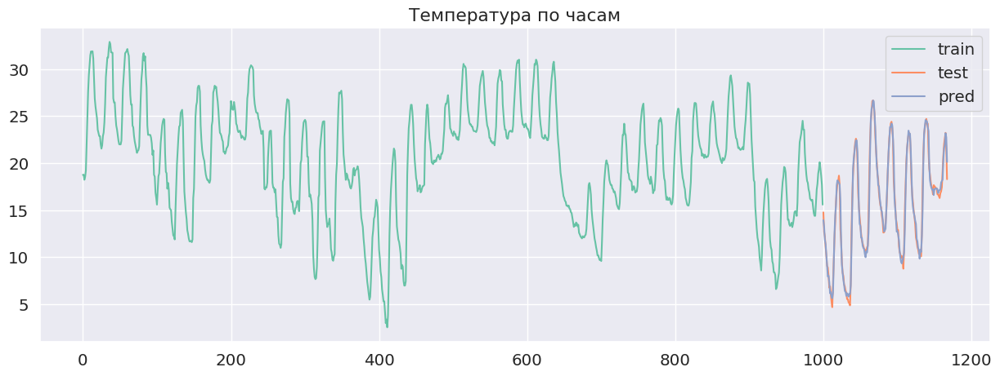

In [51]:
plt.figure(figsize=(15, 5))
plt.title("Температура по часам")
plt.plot(y_train[-1000::].values, label="train")
plt.plot(np.concatenate((np.full(1000, np.nan), y_test.values)), label="test")
plt.plot(np.concatenate((np.full(1000, np.nan), y_pred_catboost)), label="pred")
plt.legend();

Хороший результат. Как видно из графика, температура почти всюду совпадает с предсказанной. Такой же результат будет даже с линейной моделью.

___
### Задача 2 

Скачайте данные о дневном спросе разных товаров в разных магазинах: https://www.kaggle.com/c/demand-forecasting-kernels-only

__1.__ Поделите train-датасет на обучающий и тестовый: последние 365 дней &mdash; в тест, все остальное &mdash; в обучение.

In [3]:
df = pd.read_csv("train.csv", parse_dates=["date"])

test_start_date = df["date"].max() - pd.Timedelta(days=364)

train_df = df[df["date"] < test_start_date]
test_df = df[df["date"] >= test_start_date]

print("Размер train:", train_df.shape)
print("Размер test:", test_df.shape)

Размер train: (730500, 4)
Размер test: (182500, 4)


__2.__ Придумайте и обучите модель для предсказания спроса на товар номер 1 в первом магазине, которая будет обходить по метрикам MSE, MAE, MAPE лучшее решение, полученное на занятии. В решении должно быть использовано **хотя бы 3 пункта** из перечисленного.
* Использовать данные о продажах товара в других магазинах в качестве дополнительных признаков для ML-моделей. Придумать больше признаков для ML-моделей. Можно использовать `tsfresh`.
* Подобрать оптимальные гиперпараметры для ML-моделей, используя кросс-валидацию на временных рядах. Обратите внимание на [`TimeSeriesSplit`](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.TimeSeriesSplit.html).
* Реализовать другую стратегию прогнозирования: **прямую** или **гибридную**. 
    * При реализации прямой/гибридной стратегий можете использовать не бустинги, а линейные модели, например, чтобы сократить время обучения 365 моделей. 
    * При реализации гибридной стратегии можете использовать [`sklearn.multioutput.RegressorChain`](https://scikit-learn.org/stable/modules/generated/sklearn.multioutput.RegressorChain.html).
* Придумать совершенно любое другое разумное улучшение, которое побьет решение с занятия.

Добавляем новые признаки, учитывая данные о продажах в других магазинах

In [4]:
def create_features(df):
    df["dayofweek"] = df["date"].dt.dayofweek
    df["dayofyear"] = df["date"].dt.dayofyear
    df["month"] = df["date"].dt.month
    df["year"] = df["date"].dt.year
    df["week"] = df["date"].dt.isocalendar().week
    
    for store in df["store"].unique():
        store_mask = df["store"] == store
        store_df = df[store_mask].copy()
        
        for shift in range(1, 15):
            df.loc[store_mask, f"shift_{shift}_{store}"] = store_df["sales"].shift(shift)
        
        for week_shift in range(1, 20):
            df.loc[store_mask, f"week_avg_{week_shift}_{store}"] = (
                store_df.groupby(["year", "week"])['sales'].transform(lambda x: x.shift(week_shift).mean())
            )
        
        for month_shift in range(1, 16):
            df.loc[store_mask, f"month_avg_{month_shift}_{store}"] = (
                store_df.groupby(["year", "month"])['sales'].transform(lambda x: x.shift(month_shift).mean())
            )

        for year_shift in range(1, 3):
            df.loc[store_mask, f"year_avg_{month_shift}_{store}"] = (
                store_df.groupby(["year", "month"])['sales'].transform(lambda x: x.shift(year_shift).mean())
            )

    for item_type in [1]:
        item_mask = df["item"] == 1
        
        item_df = df[item_mask].copy()
        
        for shift in range(1, 15):
            df.loc[item_mask, f"shift_{shift}_itemtype_{item_type}"] = item_df["sales"].shift(shift)
        
        for week_shift in range(1, 5):
            df.loc[item_mask, f"week_avg_{week_shift}_itemtype_{item_type}"] = (
                item_df.groupby(["year", "week"])['sales'].transform(lambda x: x.shift(week_shift).mean())
            )
        
    return df


Сами данные

In [5]:
pd.options.mode.chained_assignment = None
import warnings
warnings.simplefilter(action='ignore', category=pd.errors.PerformanceWarning)

train_df = create_features(train_df)

train_df = train_df[(train_df['store'] == 1) & (train_df['item'] == 1)]
test_df = test_df[(test_df['store'] == 1) & (test_df['item'] == 1)]


Подберем гиперпараметры для предсказывания на 120 дней вперед. Будем использовать их как базовые

In [ ]:
X_train = train_df.drop(columns=['date', 'sales'])
y_train = train_df['sales'].shift(-120)

X_train = X_train[~y_train.isna()]
y_train = y_train.dropna()

features = X_train.columns.tolist()

tscv = TimeSeriesSplit(n_splits=3)
random_grid = {
    "depth": [4, 6, 8],
    "learning_rate": [0.005, 0.01, 0.05],
    "n_estimators": [1200],
}

model = CatBoostRegressor(verbose=1)
random_search = RandomizedSearchCV(model, random_grid,
                                   scoring='neg_mean_absolute_percentage_error',
                                   cv=tscv, n_iter=5, n_jobs=-1)
random_search.fit(X_train, y_train)
best_params = random_search.best_params_

Лучшие параметры и скор

In [7]:
random_search.best_params_, random_search.best_score_

({'n_estimators': 1200, 'learning_rate': 0.01, 'depth': 6},
 -0.20947215454373846)

Обучим 365 моделей

In [ ]:
models = {}

for n in tqdm(range(1, 366)):
    train_df[f'sales_target_{n}'] = train_df['sales'].shift(-n)
    
    X = train_df[features]
    y = train_df[f'sales_target_{n}']

    X = X[~y.isna()]
    y = y.dropna()
    
    model = CatBoostRegressor(**random_search.best_params_, verbose=0)
    model.fit(X, y)
    models[n] = model

Делаю предсказание и считаю MAPE. Вспомогательная функция

In [9]:
def add_results_in_comparison_table(
    method: str, y_true, y_forecast
) -> pd.DataFrame:
    """
    Добавляет новую строчку в таблицу compare_table
    с результатами текущей модели.

    Если ранее модель была уже добавлена в таблицу,
    то старая строчка перезапишется на новую.

    Параметры:
    - method: имя модели.
    - y_true: истинные значения.
    - y_forecast: предсказанные значения.
    """

    # Обращаемся к глобальной переменной
    global compare_table

    # Считаем метрики
    result_row = {
        "method": method,
        "MSE": mean_squared_error(
            y_true=y_true, y_pred=y_forecast
        ),
        "MAE": mean_absolute_error(
            y_true=y_true, y_pred=y_forecast
        ),
        "MAPE": mean_absolute_percentage_error(
            y_true=y_true, y_pred=y_forecast
        ),
    }

    # Записываем результат в таблицу
    if compare_table is None:
        compare_table = pd.DataFrame([result_row])
    else:
        if method in list(compare_table["method"]):
            compare_table = compare_table[
                compare_table["method"] != method
            ]

        compare_table = pd.concat(
            [compare_table, pd.DataFrame([result_row])]
        )
        compare_table.index = np.arange(len(compare_table))
    return compare_table

Итого

In [10]:
compare_table = None

last_row = train_df[features].iloc[-1:].values
predict = [models[n].predict(last_row)[0] for n in range(1, 366)]
mean_absolute_percentage_error(test_df['sales'], predict)

add_results_in_comparison_table(
    "Catboosts_365", test_df['sales'], predict
)

,method,MSE,MAE,MAPE
0,Catboosts_365,27.548361,4.120604,0.204843


Получилось не очень. Проблема в том, что агрегировать нужно статистики за весь год, а из за этого сильно расстет размерность задачи, а из-за этого модель слишком долго обучается и требуется большая выборка.

__3.__ Реализуйте модели, которые будут предсказывать спрос на товары во всех магазинах на тестовой части датасета. Получите значение метрик MSE, MAE, MAPE для всех предсказаний. При этом моделей должно быть меньше, чем количество различных пар "номер магазина, номер товара" в датасете, но больше одной модели.

Можно сделать модель, которые будут по продажам товаров типа 1 в магазинах типа 1 предсказывать все остальные продажи. То есть тип магазина и тип товара будут признаком в модели.

Модель для каждого магазина своя

Сначала создание выборки

In [11]:
df = pd.read_csv("train.csv", parse_dates=["date"])
df["dayofweek"] = df["date"].dt.dayofweek
df["dayofyear"] = df["date"].dt.dayofyear
df["month"] = df["date"].dt.month
df["year"] = df["date"].dt.year
df["week"] = df["date"].dt.isocalendar().week

test_start_date = pd.to_datetime("2017-01-01")

train_mask = df["date"] < test_start_date
test_mask = df["date"] >= test_start_date

df_train = df[train_mask].copy()
df_test = df[test_mask].copy()

features = ["item", "dayofweek", "dayofyear",
            "year", "week", "month", "sales_1_1"]

Делим на трейн и тест, добавляем нужные признаки. Обучаем

In [12]:
store_models = {}
random_grid = {
    "depth": [4, 6, 8],
    "learning_rate": [0.005, 0.01, 0.05],
    "n_estimators": [500],
}

for store in tqdm(df_train["store"].unique()):
    print(f"Обучаем модель для магазина {store}...")
    
    store_train = df_train[df_train["store"] == store].copy()
    
    sales_1_1 = store_train[store_train["item"] == 1][["date", "sales"]].rename(columns={"sales": "sales_1_1"})
    store_train = store_train.merge(sales_1_1, on="date", how="left")

    store_train["sales_1_1"] = store_train["sales_1_1"].fillna(method="ffill").fillna(method="bfill")

    store_train["k"] = store_train["sales"] / store_train["sales_1_1"]
    store_train = store_train.dropna(subset=["k"])

    X_train = store_train[features]
    y_train = store_train["k"]

    tscv = TimeSeriesSplit(n_splits=3)

    model = CatBoostRegressor(verbose=0, loss_function="MAPE")
    catboost_search = RandomizedSearchCV(model, random_grid,
                                         scoring='neg_mean_absolute_percentage_error', 
                                         cv=tscv, n_iter=5, n_jobs=-1)
    
    catboost_search.fit(X_train, y_train)
    store_models[store] = catboost_search.best_estimator_
    print(f"Модель для магазина {store} обучена. Лучшие параметры: {catboost_search.best_params_}")

  0%|          | 0/10 [00:00<?, ?it/s]

Обучаем модель для магазина 1...


/tmp/ipykernel_38275/182796698.py:16: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  store_train["sales_1_1"] = store_train["sales_1_1"].fillna(method="ffill").fillna(method="bfill")


Модель для магазина 1 обучена. Лучшие параметры: {'n_estimators': 500, 'learning_rate': 0.005, 'depth': 8}
Обучаем модель для магазина 2...


/tmp/ipykernel_38275/182796698.py:16: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  store_train["sales_1_1"] = store_train["sales_1_1"].fillna(method="ffill").fillna(method="bfill")


Модель для магазина 2 обучена. Лучшие параметры: {'n_estimators': 500, 'learning_rate': 0.005, 'depth': 8}
Обучаем модель для магазина 3...


/tmp/ipykernel_38275/182796698.py:16: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  store_train["sales_1_1"] = store_train["sales_1_1"].fillna(method="ffill").fillna(method="bfill")


Модель для магазина 3 обучена. Лучшие параметры: {'n_estimators': 500, 'learning_rate': 0.005, 'depth': 6}
Обучаем модель для магазина 4...


/tmp/ipykernel_38275/182796698.py:16: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  store_train["sales_1_1"] = store_train["sales_1_1"].fillna(method="ffill").fillna(method="bfill")


Модель для магазина 4 обучена. Лучшие параметры: {'n_estimators': 500, 'learning_rate': 0.01, 'depth': 4}
Обучаем модель для магазина 5...


/tmp/ipykernel_38275/182796698.py:16: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  store_train["sales_1_1"] = store_train["sales_1_1"].fillna(method="ffill").fillna(method="bfill")


Модель для магазина 5 обучена. Лучшие параметры: {'n_estimators': 500, 'learning_rate': 0.01, 'depth': 4}
Обучаем модель для магазина 6...


/tmp/ipykernel_38275/182796698.py:16: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  store_train["sales_1_1"] = store_train["sales_1_1"].fillna(method="ffill").fillna(method="bfill")


Модель для магазина 6 обучена. Лучшие параметры: {'n_estimators': 500, 'learning_rate': 0.005, 'depth': 4}
Обучаем модель для магазина 7...


/tmp/ipykernel_38275/182796698.py:16: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  store_train["sales_1_1"] = store_train["sales_1_1"].fillna(method="ffill").fillna(method="bfill")


Модель для магазина 7 обучена. Лучшие параметры: {'n_estimators': 500, 'learning_rate': 0.005, 'depth': 4}
Обучаем модель для магазина 8...


/tmp/ipykernel_38275/182796698.py:16: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  store_train["sales_1_1"] = store_train["sales_1_1"].fillna(method="ffill").fillna(method="bfill")


Модель для магазина 8 обучена. Лучшие параметры: {'n_estimators': 500, 'learning_rate': 0.005, 'depth': 6}
Обучаем модель для магазина 9...


/tmp/ipykernel_38275/182796698.py:16: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  store_train["sales_1_1"] = store_train["sales_1_1"].fillna(method="ffill").fillna(method="bfill")


Модель для магазина 9 обучена. Лучшие параметры: {'n_estimators': 500, 'learning_rate': 0.005, 'depth': 4}
Обучаем модель для магазина 10...


/tmp/ipykernel_38275/182796698.py:16: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  store_train["sales_1_1"] = store_train["sales_1_1"].fillna(method="ffill").fillna(method="bfill")


Модель для магазина 10 обучена. Лучшие параметры: {'n_estimators': 500, 'learning_rate': 0.005, 'depth': 6}


Посчитаем предказание на тестовый год композиции моделей (то есть на все покупки во всех магазинах) 

In [15]:
pred_df = pd.DataFrame({"date": df_test["date"].unique(), "sales_1_1": predict})
df_test = df_test.merge(pred_df, on="date", how="left")

df_test["k_pred"] = np.nan

for store in df_test["store"].unique():
    store_mask = df_test["store"] == store
    if store in store_models:
        df_test.loc[store_mask, "k_pred"] = store_models[store].predict(
            df_test.loc[store_mask, features]
        )

# Получаем финальные предсказания
df_test["sales_pred"] = df_test["k_pred"] * df_test["sales_1_1"]

Итого

In [19]:
add_results_in_comparison_table(
    "Catboost full predict over Catboosts_365", df_test["sales"], df_test["sales_pred"]
)

,method,MSE,MAE,MAPE
0,Catboosts_365,27.548361,4.120604,0.204843
1,Catboost full predict over Catboosts_365,826.776091,20.691035,0.342157


Как видно, в процентном соотношении mape упала несильно, а MAE, MSE - намного больше. Похоже есть крупные отклонения, которые не детектятся этой моделью. Требуется более аккуратная настройка

Итого, не самыми сложными манипуляциями у нас получилось анализировать временные ряды